# 7. Llama 3.1 base model inference

위와 같은 트레이닝을 마치면, "BASE MODEL"이라는 것이 나오게 되고, 이러한 베이스모델을 공개한다는 것은 두가지를 의미함.
1. 소스코드 https://github.com/openai/gpt-2/blob/master/src/model.py
2. 그리고, 가중치! (gpt2 1.5B parameter에 들어있는 숫자값들)

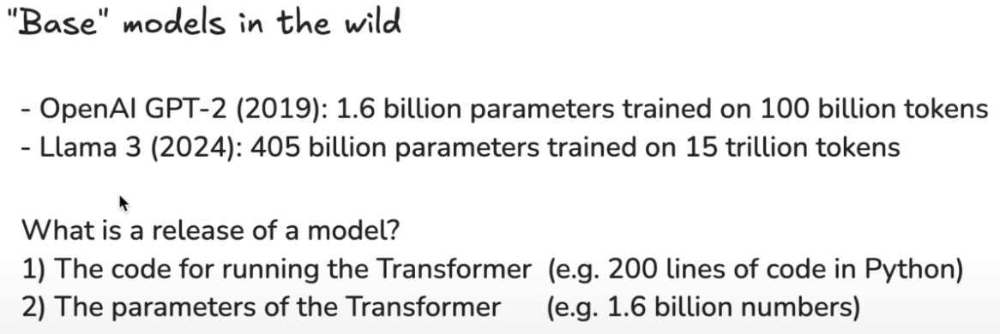

gpt-2는 너무 오래된 모델이니까, llama 3의 베이스모델에서 inference를 해보자

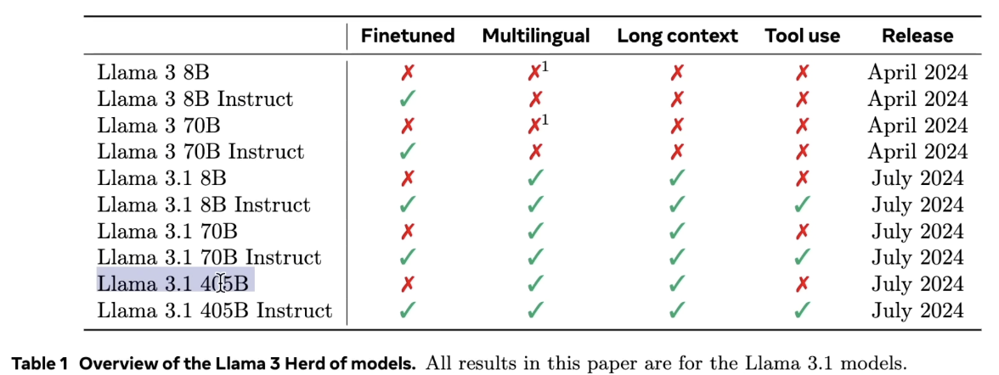

베이스모델은 다음 토큰 예측기계임. 

(아직 Assistant형태 (-instruct)의 대화형 QA모델로 post-training되지 않았기 때문에)

만약 질문을 한다고 해도, 답변을 내놓지 않고, 질문을 이어나가는 모습을 보이게 됨

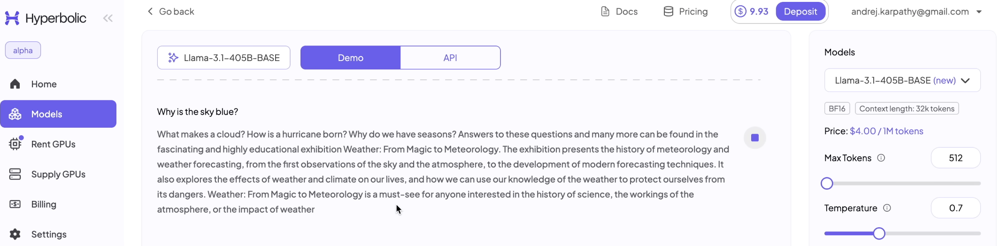

그렇다고 해서, Base Model이 쓸모없다는 것은 아님.

이 베이스모델은 "인터넷에 대한 손실압축"이라고 볼 수 있음. 
(* 다음 단어를 잘 예측하는 과정에서, 세상에 대한 이해를 강제하게 되었음. OpenAI Jason Wei에 따르면, 이러한 base model을 만드는 과정은 "Multi Task Learning"임. 시제, 성별, 번역, 세상에 대한 지식을 쌓아야만 다음 토큰 예측을 잘 할 수 있기 때문.)

그래서, Paris에서 봐야 할 10개의 랜드마크: 라는 식으로 프롬프트를 넣으면, QA형식은 아니지만 나름 이어서 유의미한 세상에 대한 정보를 알려주고 있음

다만, 데이터베이스에 저장된 정보를 알려주는 것이 아니고, 여전히 확률적 stochastic한 아웃풋을 이어나간다고 봐야 함. 꿈을 꾸는 것과 비슷함.

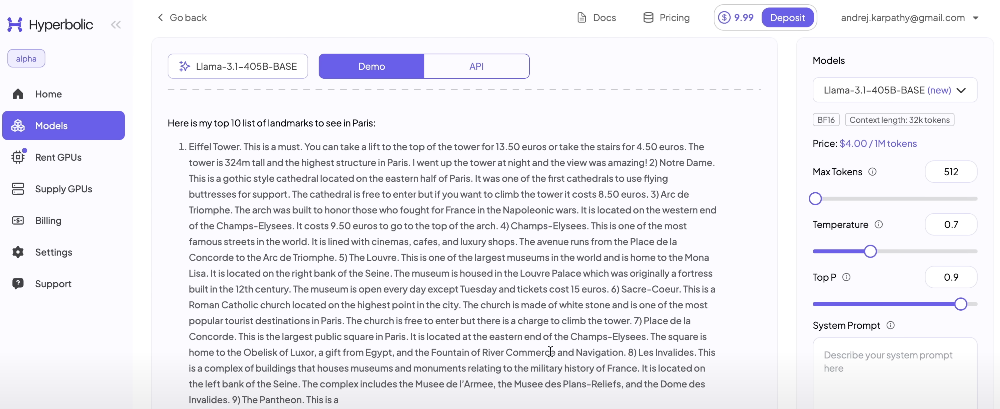

기타 베이스모델 인퍼런스 사례들로,

위키피디아와 같은 데이터 소스는 양질의 데이터라고 보기 때문에, 여러차례 학습을 시켰을 것. 따라서, 위키피디아의 문장으로 시작하면, 해당 내용을 외워서 답변함. 이를 regurgitation (이해하지 않고 그냥 통째로 외워서 답변)이라고 하는데, 우리가 모델에 원하는 모습은 아님.

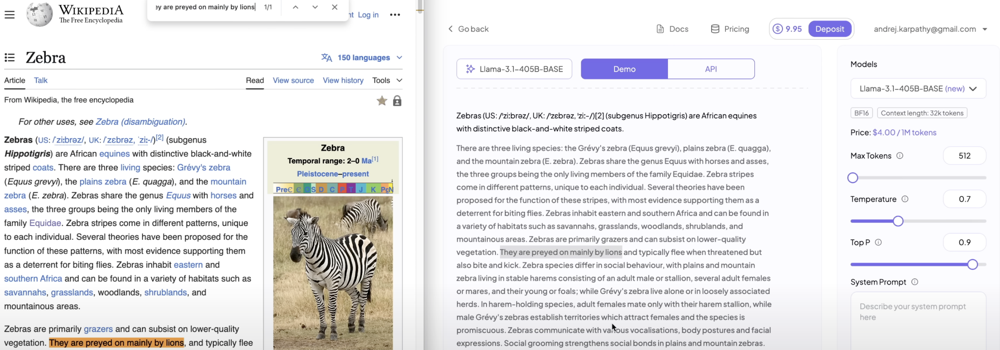

또한, knowledge cutoff (llama 3의 경우 2023년말까지) 이후에 벌어진 일에 대해서 물어보면, 바로 hallucination하는 모습을 보임. 

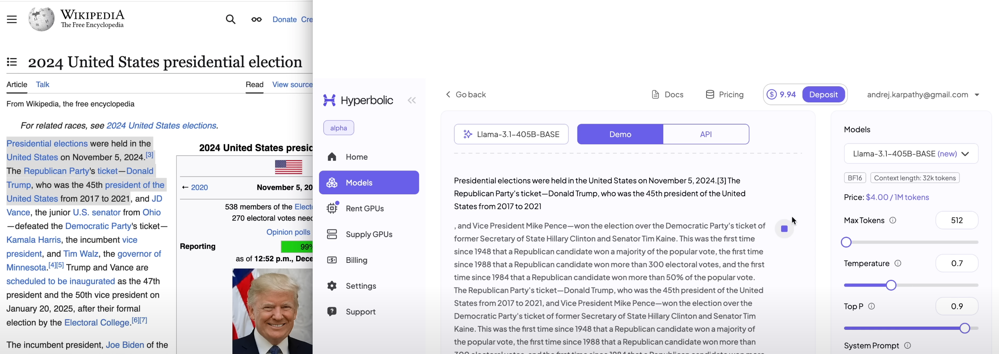

또한 비록 베이스모델이지만 프롬프팅을 잘 해서, 유용하게 사용하는 또 다른 방법 중에, in-context learning ability을 활용하는 방법도 있음. 아래와 같은 few-shot 패턴을 보면, 번역 작업이라는 것을 모델이 in-context에서 알 수 있기 때문

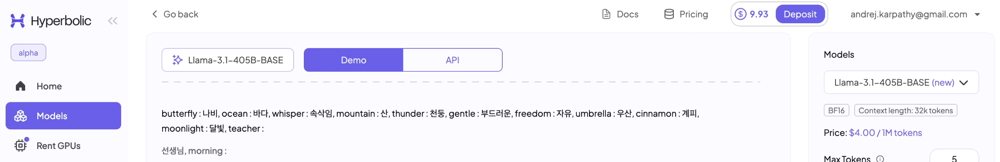


Human : 

Assistant : 

형식으로 few-shot 예제를 보여줘도 assistant 역할인것처럼 보이게 만들 수 있음.

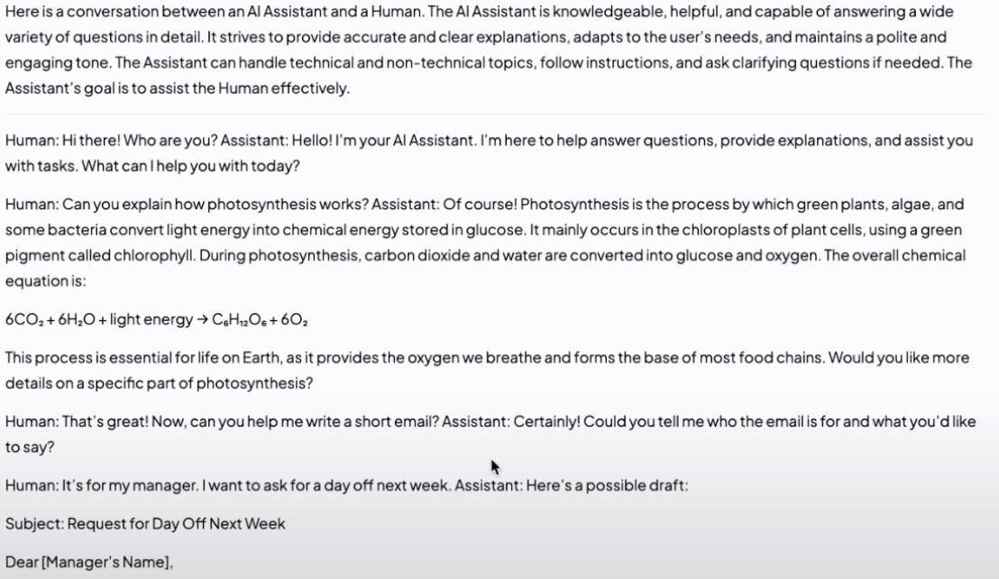

베이스모델 정리.

. 토큰 레벨 인터넷 문서 시뮬레이터.

. stochastic / probabilistic (실행할 때마다 다른 결과)

. 인터넷 문서에 대한 "꿈을 꾼다"

. 많이 본 문서는 통째로 외워버림 ('regurgitation')

. 모델의 파라미터는 인터넷에 대한 손실 압축 파일과도 같음. 
  ==> 세상에 대한 유용한 정보가 네트워크 파라미터에 저장되어있음.)

. 아직 베이스모델이지만, fewshot 프롬프팅을 통해 in-context learning ability를 활용하여 유용한 어플리케이션을 만들 수도 있음.

. 그러나, 더 잘 할 수 있다!

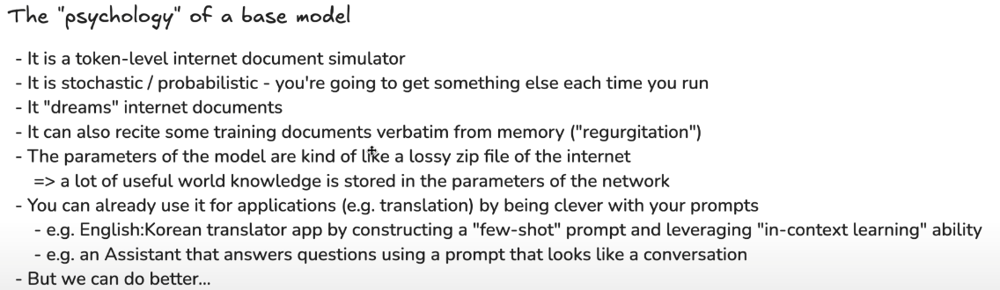

# 8. Pretraining to Post-training

한시간 동안 설명한 여기까지를 "PRETRAINING" 단계라고 부르며, 이 결과 "BASE MODEL"을 얻게 됨. 
주로 가장 큰 비용이 들어가는 절차가 여기에 해당됨. 

이제 QA가 가능한 유용한 Assistant 형태로 바꾸기 위해 Post Training 단계로 넘어가자.
Pretraining에 비하면 상대적으로 비용은 덜 들어가지만, 매우 중요한 단계임.

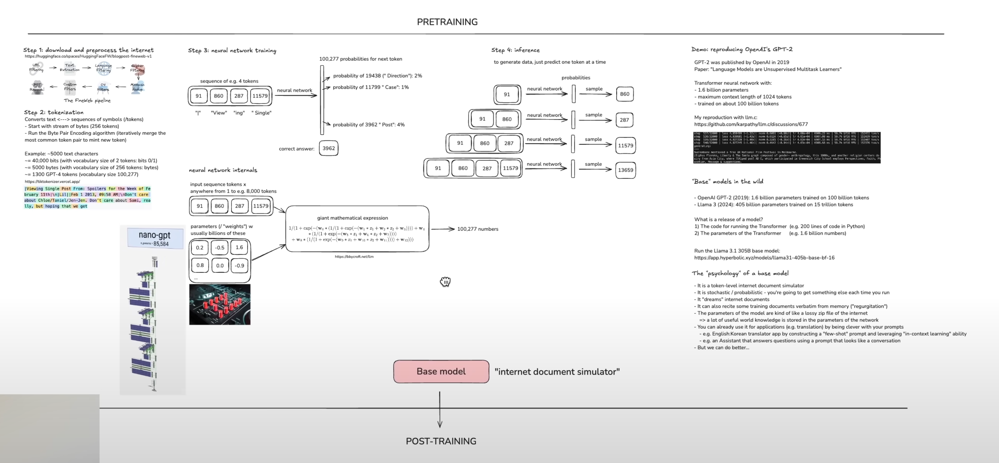